# Ensemble 1: constraint spacing vs regional field strength

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import itertools
import logging
import os
import pathlib
import pickle
import shutil

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps
from polartoolkit import utils as polar_utils
from tqdm.autonotebook import tqdm

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, optimization, plotting, regional, utils

In [2]:
ensemble_path = "../results/Ross_Sea/ensembles/Ross_Sea_ensemble_01_constraint_spacing_vs_regional_strength_with_density_estimation"
ensemble_fname = f"{ensemble_path}.csv"

INFO:polartoolkit:changing grid region, spacing and/or registration
INFO:polartoolkit:requested spacing (2000.0) larger than original (500.0), filtering before resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
INFO:polartoolkit:converting to be reference to the WGS84 ellipsoid
INFO:polartoolkit:changing grid region, spacing and/or registration
INFO:polartoolkit:changing grid region, spacing and/or registration


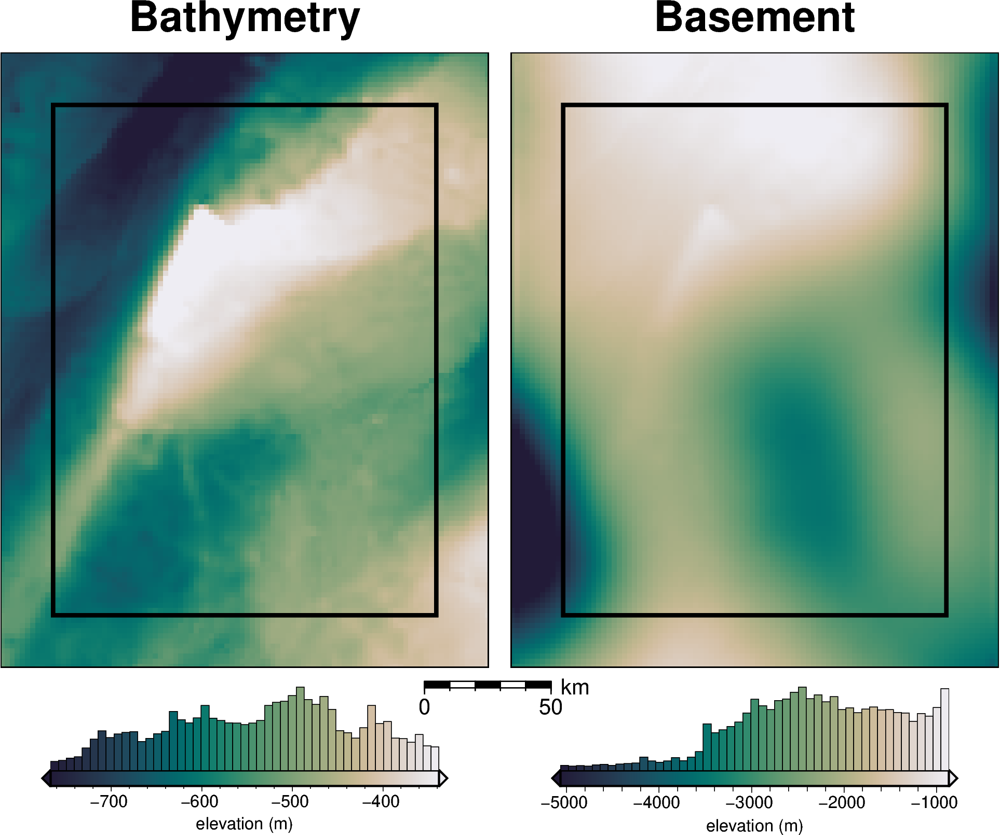

  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

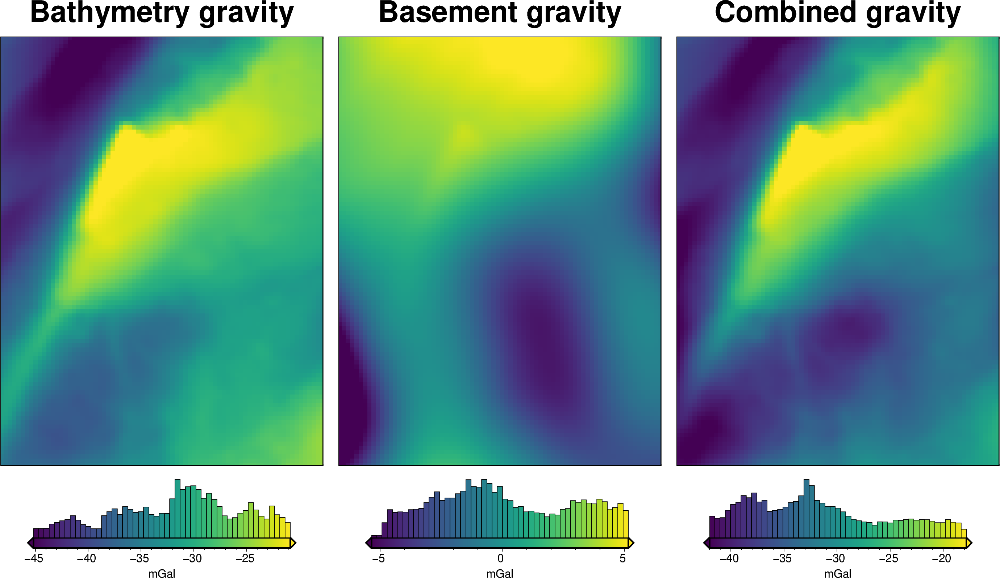

30000.0

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, original_grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inside_bathymetry = bathymetry.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

inversion_area

In [4]:
# normalize regional gravity between 0 and 1
original_grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            original_grav_df.set_index(["northing", "easting"])
            .to_xarray()
            .basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
original_grav_df = original_grav_df.drop(
    columns=["basement_grav", "disturbance", "gravity_anomaly"]
)
original_grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized
0,-1600000.0,-40000.0,1000.0,-35.551085,-0.575645
1,-1600000.0,-38000.0,1000.0,-36.054683,-0.523223
2,-1600000.0,-36000.0,1000.0,-36.473168,-0.466365
3,-1600000.0,-34000.0,1000.0,-36.755627,-0.406022
4,-1600000.0,-32000.0,1000.0,-36.951045,-0.343163
...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0.399167
7672,-1400000.0,104000.0,1000.0,-25.911429,0.334798
7673,-1400000.0,106000.0,1000.0,-26.032814,0.268741
7674,-1400000.0,108000.0,1000.0,-26.121903,0.201716


In [5]:
num = 10

# Define total number of constraints
constraint_numbers = [
    round(x) for x in np.geomspace(4, 650, num)
]  # -> median distance of 17.7-2.5 km, log scale, w/ border

constraint_numbers = [round(i) for i in constraint_numbers]
assert len(pd.Series(constraint_numbers).unique()) == num

# Define regional strength
regional_strengths = [float(round(x, 2)) for x in np.linspace(20, 200, num)]

print("number of constraints:", constraint_numbers)
print("regional strengths:", regional_strengths)

number of constraints: [4, 7, 12, 22, 38, 68, 119, 210, 369, 650]
regional strengths: [20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 140.0, 160.0, 180.0, 200.0]


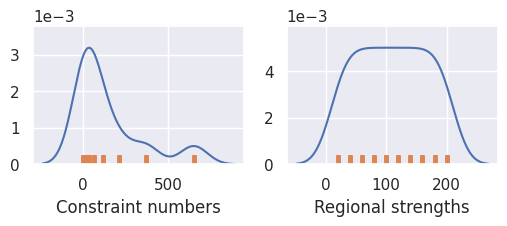

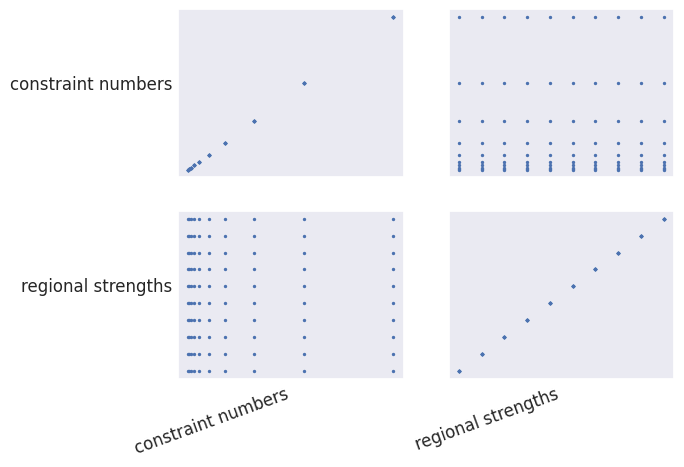

In [6]:
# turn into dataframe
sampled_params_df = pd.DataFrame(
    itertools.product(
        constraint_numbers,
        regional_strengths,
    ),
    columns=[
        "constraint_numbers",
        "regional_strengths",
    ],
)

sampled_params_dict = dict(
    constraint_numbers=dict(sampled_values=sampled_params_df.constraint_numbers),
    regional_strengths=dict(sampled_values=sampled_params_df.regional_strengths),
)

plotting.plot_latin_hypercube(
    sampled_params_dict,
)

# Create starting models and constraints
Only need to do this for unique combinations of constraint_numbers and constraint_noise_levels

In [ ]:
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    dampings=None,
)

# get high res grid for computing constraint spacing
bathymetry_highres, _, _ = synthetic.load_synthetic_model(
    spacing=500,
    just_topography=True,
)

# clip to inversion region
bathymetry_highres = bathymetry_highres.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

sampled_params_df["constraint_points_fname"] = np.nan
sampled_params_df["starting_bathymetry_fname"] = np.nan
sampled_params_df["starting_prisms_fname"] = np.nan

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # check if constraint spacing is already done
    # if so, copy it
    subset_with_same_params = sampled_params_df[
        sampled_params_df.constraint_numbers == row.constraint_numbers
    ]

    if (len(subset_with_same_params) > 1) & (
        subset_with_same_params.constraint_points_fname.iloc[0] is not np.nan
    ):
        # copy and rename files
        shutil.copy(
            subset_with_same_params.constraint_points_fname.iloc[0],
            f"{ensemble_path}_constraint_points_{i}.csv",
        )
        shutil.copy(
            subset_with_same_params.starting_bathymetry_fname.iloc[0],
            f"{ensemble_path}_starting_bathymetry_{i}.nc",
        )
        shutil.copy(
            subset_with_same_params.starting_prisms_fname.iloc[0],
            f"{ensemble_path}_starting_prisms_{i}.nc",
        )

        # copy other columns
        sampled_params_df.loc[i, "constraints_starting_rmse"] = (
            subset_with_same_params.constraints_starting_rmse.iloc[0]
        )
        print("skipping and using already created data")
    else:
        # make constraint points
        constraint_points = synthetic.constraint_layout_number(
            num_constraints=row.constraint_numbers,
            region=inversion_region,
            padding=-spacing,
            # plot=True,
            seed=10,
            shapefile="../results/Ross_Sea_outline.shp",
            add_outside_points=True,
            grid_spacing=spacing,
        )

        # sample true topography at these points
        constraint_points = utils.sample_grids(
            constraint_points,
            bathymetry,
            "true_upward",
            coord_names=("easting", "northing"),
        )
        constraint_points["upward"] = constraint_points.true_upward

        # grid the sampled values using verde
        starting_bathymetry = utils.create_topography(
            constraints_df=constraint_points,
            **starting_topography_kwargs,
        )

        # sample the inverted topography at the constraint points
        constraint_points = utils.sample_grids(
            constraint_points,
            starting_bathymetry,
            "starting_bathymetry",
            coord_names=("easting", "northing"),
        )

        constraints_rmse = utils.rmse(
            constraint_points.true_upward - constraint_points.starting_bathymetry
        )

        zref = 0
        density_contrast = true_density_contrast

        # make density grid
        density_grid = xr.where(
            starting_bathymetry >= zref,
            density_contrast,
            -density_contrast,
        )

        # create layer of prisms
        starting_prisms = utils.grids_to_prisms(
            starting_bathymetry,
            zref,
            density=density_grid,
        )

        sampled_params_df.loc[i, "constraints_starting_rmse"] = constraints_rmse
        starting_bathymetry.attrs["damping"] = None

        # save to files
        constraint_points.to_csv(
            f"{ensemble_path}_constraint_points_{i}.csv", index=False
        )
        starting_bathymetry.drop_attrs().to_netcdf(
            f"{ensemble_path}_starting_bathymetry_{i}.nc"
        )
        starting_prisms.to_netcdf(f"{ensemble_path}_starting_prisms_{i}.nc")

    # set file names, add to dataframe
    sampled_params_df.loc[i, "constraint_points_fname"] = (
        f"{ensemble_path}_constraint_points_{i}.csv"
    )
    sampled_params_df.loc[i, "starting_bathymetry_fname"] = (
        f"{ensemble_path}_starting_bathymetry_{i}.nc"
    )
    sampled_params_df.loc[i, "starting_prisms_fname"] = (
        f"{ensemble_path}_starting_prisms_{i}.nc"
    )


sampled_params_df

In [ ]:
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate min dist between each grid cell and nearest constraint
    coords = vd.grid_coordinates(
        region=inversion_region,
        spacing=100,
    )
    grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
    min_dist = utils.dist_nearest_points(
        constraint_points,
        grid,
    ).min_dist

    # mask to the ice shelf outline
    min_dist = polar_utils.mask_from_shp(
        shapefile="../results/Ross_Sea_outline.shp",
        grid=min_dist,
        invert=False,
        masked=True,
    )
    # calculate average constraint spacing
    # constraint_spacing =  (
    #     np.median(
    #         vd.median_distance(
    #             (constraint_points.easting, constraint_points.northing),
    #             k_nearest=1,
    #         )
    #     )
    #     / 1e3
    # )
    constraint_proximity = int(min_dist.median().values) / 1e3
    sampled_params_df.loc[i, "median_proximity"] = constraint_proximity
    sampled_params_df.loc[i, "maximum_constraint_proximity"] = (
        int(min_dist.max().values) / 1e3
    )
    sampled_params_df.loc[i, "constraint_proximity_skewness"] = sp.stats.skew(
        min_dist.values.ravel(), nan_policy="omit"
    )
    sampled_params_df.loc[i, "constraints_per_10000sq_km"] = (
        len(constraint_points) / inversion_area
    ) * 10e3

sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,...,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inverted_bathymetry_fname,final_inversion_results_fname,final_inversion_constraints_rmse,final_inversion_rmse,final_inversion_topo_improvement_rmse,maximum_constraint_proximity,constraint_proximity_skewness,median_proximity
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,26.666656,19.654786,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.416304,25.705860,20.615582,51.305,0.483691,17.755
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,54.946683,-8.625241,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.817794,47.161472,-0.840030,51.305,0.483691,17.755
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,83.417783,-37.096341,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.235913,64.446391,-18.124949,51.305,0.483691,17.755
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,111.988379,-65.666937,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.521366,73.064049,-26.742607,51.305,0.483691,17.755
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,140.641935,-94.320493,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.673602,76.397586,-30.076144,51.305,0.483691,17.755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.052972,3.875105,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.797255,3.143586,2.784492,6.333,-0.144477,2.520
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.055300,3.872778,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.820418,3.222559,2.705518,6.333,-0.144477,2.520
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.088355,3.839723,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.834046,3.239747,2.688331,6.333,-0.1

In [9]:
sampled_params_df[
    [
        "constraint_numbers",
        "median_proximity",
        "maximum_constraint_proximity",
        "constraint_proximity_skewness",
    ]
].describe()

,constraint_numbers,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness
count,100.000000,100.000000,100.000000,100.000000
mean,149.900000,8.919700,25.135300,0.259203
std,200.751844,5.092535,14.650223,0.192085
min,4.000000,2.520000,6.333000,-0.144477
25%,12.000000,4.256000,12.387000,0.146099
50%,53.000000,7.956500,20.771500,0.277189
75%,210.000000,13.483000,38.792000,0.441687
max,650.000000,17.755000,51.305000,0.483691


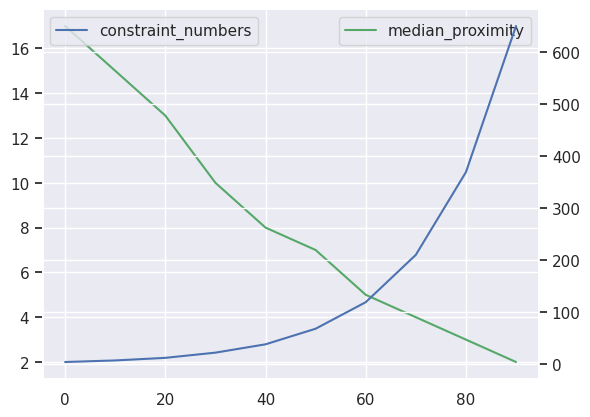

In [16]:
ax = sampled_params_df[::num].median_proximity.plot(c="g")
ax2 = ax.twinx()
ax2 = sampled_params_df[::num].constraint_numbers.plot(ax=ax2)
ax.legend()
ax2.legend()

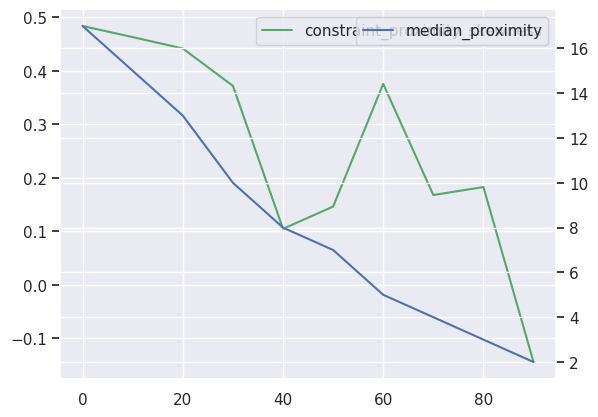

In [17]:
ax = sampled_params_df[::num].constraint_proximity_skewness.plot(c="g")

ax2 = ax.twinx()
ax2 = sampled_params_df[::num].median_proximity.plot(ax=ax2)
ax.legend()
ax2.legend()

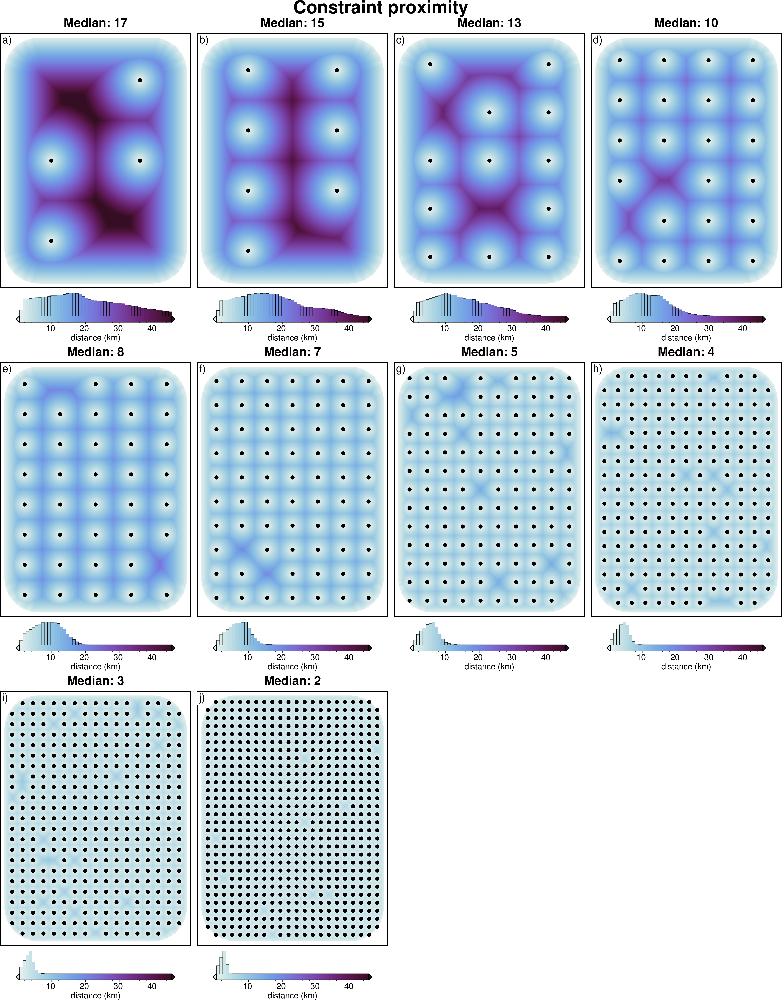

In [ ]:
# subplots showing starting bathymetry error
grids = []
titles = []
cbar_labels = []
constraints = []
for i, row in sampled_params_df.iterrows():
    if i % num == 0:
        constraint_points = pd.read_csv(row.constraint_points_fname)

        # calculate min dist between each grid cell and nearest constraint
        coords = vd.grid_coordinates(
            region=inversion_region,
            spacing=100,
        )
        grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
        min_dist = (
            utils.dist_nearest_points(
                constraint_points,
                grid,
            ).min_dist
            / 1e3
        )

        # mask to the ice shelf outline
        min_dist = polar_utils.mask_from_shp(
            shapefile="../results/Ross_Sea_outline.shp",
            grid=min_dist,
            invert=False,
            masked=True,
        )

        # add to lists
        grids.append(min_dist)
        titles.append(f"Median: {round(row.median_proximity)}")
        # cbar_labels.append(f"RMSE: {round(utils.rmse(dif),2)} (m)")
        constraints.append(constraint_points[constraint_points.inside])

fig = maps.subplots(
    grids,
    fig_title="Constraint proximity",
    titles=titles,
    cbar_label="distance (km)",
    cmap="dense",
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    point_sets=constraints,
    # points_style="p.02c",
    cbar_font="18p,Helvetica,black",
)


fig.show()

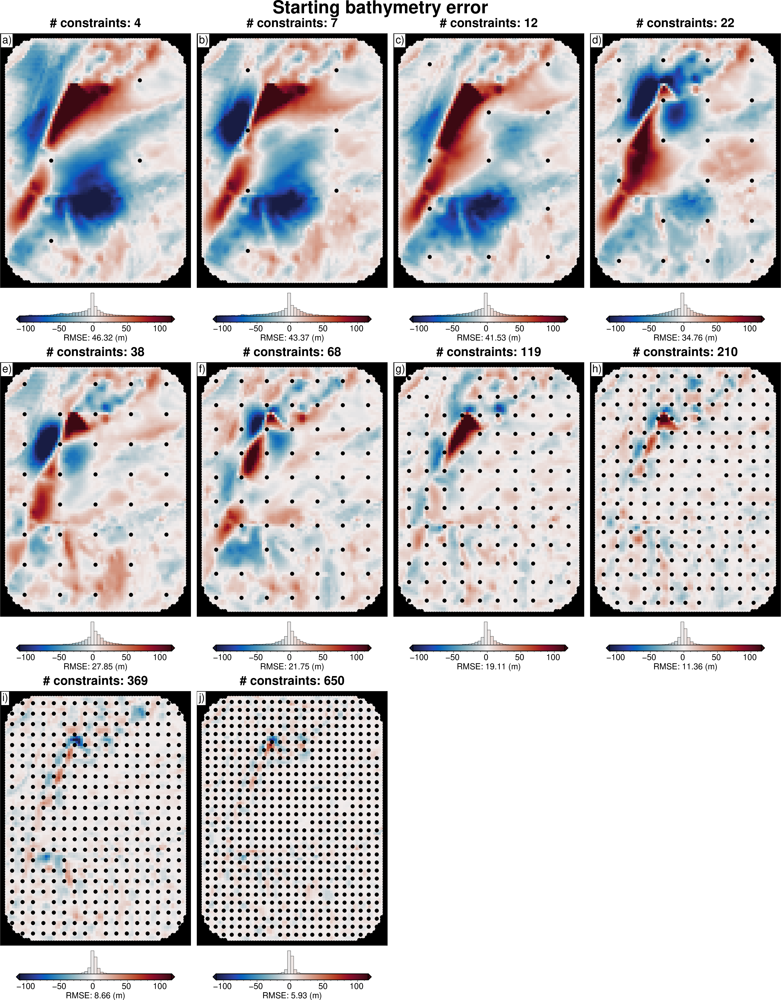

In [9]:
# subplots showing starting bathymetry error
grids = []
titles = []
cbar_labels = []
constraints = []
for i, row in sampled_params_df.iterrows():
    if i % num == 0:
        starting_bathymetry = xr.open_dataarray(row.starting_bathymetry_fname)
        constraint_points = pd.read_csv(row.constraint_points_fname)

        dif = bathymetry - starting_bathymetry

        dif = dif.sel(
            easting=slice(inversion_region[0], inversion_region[1]),
            northing=slice(inversion_region[2], inversion_region[3]),
        )
        # add to lists
        grids.append(dif)
        titles.append(f"# constraints: {round(row.constraint_numbers)}")
        cbar_labels.append(f"RMSE: {round(utils.rmse(dif), 2)} (m)")
        constraints.append(constraint_points)

fig = maps.subplots(
    grids,
    fig_title="Starting bathymetry error",
    titles=titles,
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    point_sets=constraints,
    # points_style="p.02c",
    cbar_font="18p,Helvetica,black",
)

fig.show()

In [38]:
sampled_params_df.columns

Index(['constraint_numbers', 'regional_strengths', 'constraint_points_fname',
       'constraints_per_10000sq_km', 'constraints_starting_rmse',
       'starting_bathymetry_fname', 'starting_prisms_fname',
       'starting_bathymetry_mae', 'starting_bathymetry_rmse', 'grav_df_fname',
       'regional_stdev', 'regional_error', 'gravity_anomaly_rms',
       'density_cv_results_fname', 'best_density_contrast',
       'true_density_results_fname', 'true_density_inverted_bathymetry_fname',
       'true_density_constraints_rmse', 'density_estimation_results_fname',
       'density_estimation_inverted_bathymetry_fname',
       'density_estimation_constraints_rmse',
       'density_estimation_inversion_rmse',
       'density_estimation_topo_improvement_rmse',
       'true_density_inversion_rmse', 'true_density_topo_improvement_rmse',
       'final_inverted_bathymetry_fname', 'final_inversion_results_fname',
       'final_inversion_constraints_rmse', 'final_inversion_rmse',
       'final_inversi

  0%|          | 0/100 [00:00<?, ?it/s]

Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 34.90619229494806
Max y value at x value: 34.90619229494806
Max y value at x value: 34.90619229494806
Max y value at x value: 21.25768200573872
Max y value at x value: 15.36769046614745
Max y value at x value: 11.988087785514033


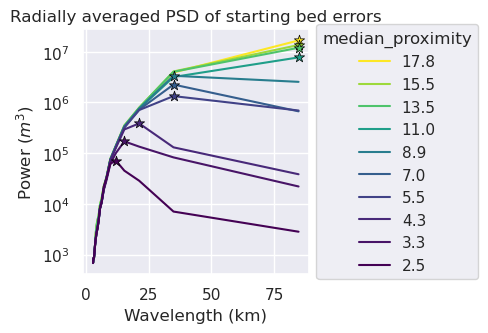

In [ ]:
import xrft

metric = "median_proximity"
grids = []
names = []
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    if i % num == 0:
        starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)

        starting_bathymetry = starting_bathymetry.sel(
            easting=slice(inversion_region[0], inversion_region[1]),
            northing=slice(inversion_region[2], inversion_region[3]),
        )

        grd = inside_bathymetry - starting_bathymetry
        # grd = starting_bathymetry

        grids.append(grd)
        names.append(round(row[metric], 1))

# grids.append(inside_bathymetry)
# names.append(0)

raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            # detrend='constant',
            detrend="linear",
            # window=False,
            # nfactor=4,
            # spacing_tol=0.01,
            # nfactor=3,
            truncate=False,
        )
    )

fig, ax = plt.subplots(figsize=(5, 3.5))

norm = plt.Normalize(
    vmin=sampled_params_df[metric].min(),
    vmax=sampled_params_df[metric].max(),
)

max_powers = []
max_power_wavelengths = []
for i, da in enumerate(raps_das):
    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=plt.cm.viridis(norm([names[i]])),
    )
    max_ind = da.idxmax()
    max_power = da.max().values
    max_power_wavelength = 1 / (da[da == max_power].freq_r.values[0]) / 1e3
    max_power_wavelengths.append(max_power_wavelength)
    max_powers.append(max_power)
    ax.scatter(
        x=max_power_wavelength,
        y=max_power,
        marker="*",
        edgecolor="black",
        linewidth=0.5,
        color=plt.cm.viridis(norm(names[i])),  # pylint: disable=no-member
        s=60,
        zorder=20,
    )
    print(f"Max y value at x value: {max_power_wavelength}")

# ax.set_xscale("log")
ax.set_yscale("log")

ax.legend(title=metric, loc="center left", bbox_to_anchor=(1, 0.5))

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("Radially averaged PSD of starting bed errors")
plt.tight_layout()

# ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

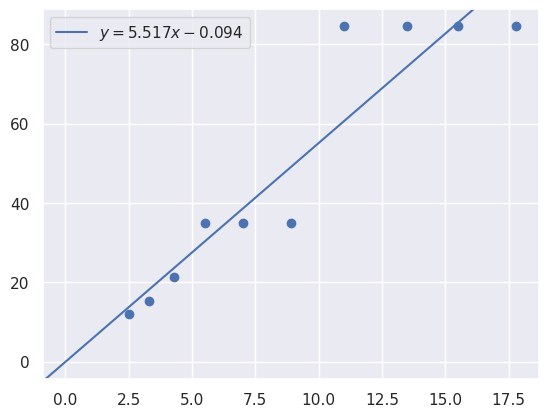

In [32]:
y = max_power_wavelengths
x = names

m, b = np.polyfit(
    x,
    y,
    1,
)

plt.scatter(
    x,
    y,
)

# plot y = m*x + b
plt.axline(xy1=(0, b), slope=m, label=f"$y = {m:.3f}x {b:+.3f}$")
plt.legend()

In [10]:
sampled_params_df["starting_bathymetry_mae"] = pd.Series()
sampled_params_df["starting_bathymetry_rmse"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)

    starting_bathymetry = starting_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    starting_bathymetry_mae = float(
        np.mean(np.abs(inside_bathymetry - starting_bathymetry))
    )
    starting_bathymetry_rmse = utils.rmse(inside_bathymetry - starting_bathymetry)

    sampled_params_df.loc[i, "starting_bathymetry_mae"] = starting_bathymetry_mae
    sampled_params_df.loc[i, "starting_bathymetry_rmse"] = starting_bathymetry_rmse
sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078


In [11]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [12]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442


# Create observed gravity
* rescale regional field


In [ ]:
sampled_params_df["grav_df_fname"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names, add to dataframe
    sampled_params_df.loc[i, "grav_df_fname"] = f"{ensemble_path}_grav_df_{i}.csv"

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...


In [14]:
logging.getLogger().setLevel(logging.WARNING)

grav_grid = original_grav_df.set_index(["northing", "easting"]).to_xarray()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # re-scale the regional gravity
    regional_grav = utils.normalize_xarray(
        grav_grid.basement_grav_normalized,
        low=0,
        high=row.regional_strengths,
    ).rename("basement_grav")
    regional_grav -= regional_grav.mean()

    # add to new dataframe
    grav_df = copy.deepcopy(original_grav_df.drop(columns=["basement_grav_normalized"]))
    grav_df["basement_grav_scaled"] = (
        vd.grid_to_table(regional_grav).reset_index().basement_grav
    )

    # add basement and bathymetry forward gravities together to make observed gravity
    grav_df["gravity_anomaly"] = grav_df.bathymetry_grav + grav_df.basement_grav_scaled

    sampled_params_df.loc[i, "regional_stdev"] = grav_df.basement_grav_scaled.std()

    # save to files
    grav_df.to_csv(row.grav_df_fname, index=False)


sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.091585
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.183171
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.274756
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.366342
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.457927


In [15]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [8]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,...,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inverted_bathymetry_fname,final_inversion_results_fname,final_inversion_constraints_rmse,final_inversion_rmse,final_inversion_topo_improvement_rmse,maximum_constraint_proximity,constraint_proximity_skewness,median_proximity
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,26.666656,19.654786,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.416304,25.705860,20.615582,51.305,0.483691,17.755
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,54.946683,-8.625241,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.817794,47.161472,-0.840030,51.305,0.483691,17.755
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,83.417783,-37.096341,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.235913,64.446391,-18.124949,51.305,0.483691,17.755
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,111.988379,-65.666937,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.521366,73.064049,-26.742607,51.305,0.483691,17.755
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,140.641935,-94.320493,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.673602,76.397586,-30.076144,51.305,0.483691,17.755


In [17]:
sampled_params_df.describe()

,constraint_numbers,regional_strengths,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_mae,starting_bathymetry_rmse,regional_stdev
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,149.900000,110.000000,8.220300,8.926700,330.933333,0.083960,15.135698,26.063273,22.503720
std,200.751844,57.735027,4.614355,5.089871,66.431876,0.095932,8.923906,14.282003,11.811390
min,4.000000,20.000000,2.386000,2.521000,282.666667,0.003561,3.335341,5.928078,4.091585
25%,12.000000,60.000000,4.019000,4.253000,285.333333,0.006497,6.381548,11.358149,12.274756
50%,53.000000,110.000000,7.386500,7.974000,299.000000,0.045115,13.749814,24.798911,22.503720
75%,210.000000,160.000000,12.343000,13.509000,350.000000,0.131169,24.695174,41.525870,32.732684
max,650.000000,200.000000,16.224000,17.741000,496.666667,0.283029,28.351052,46.321442,40.915854


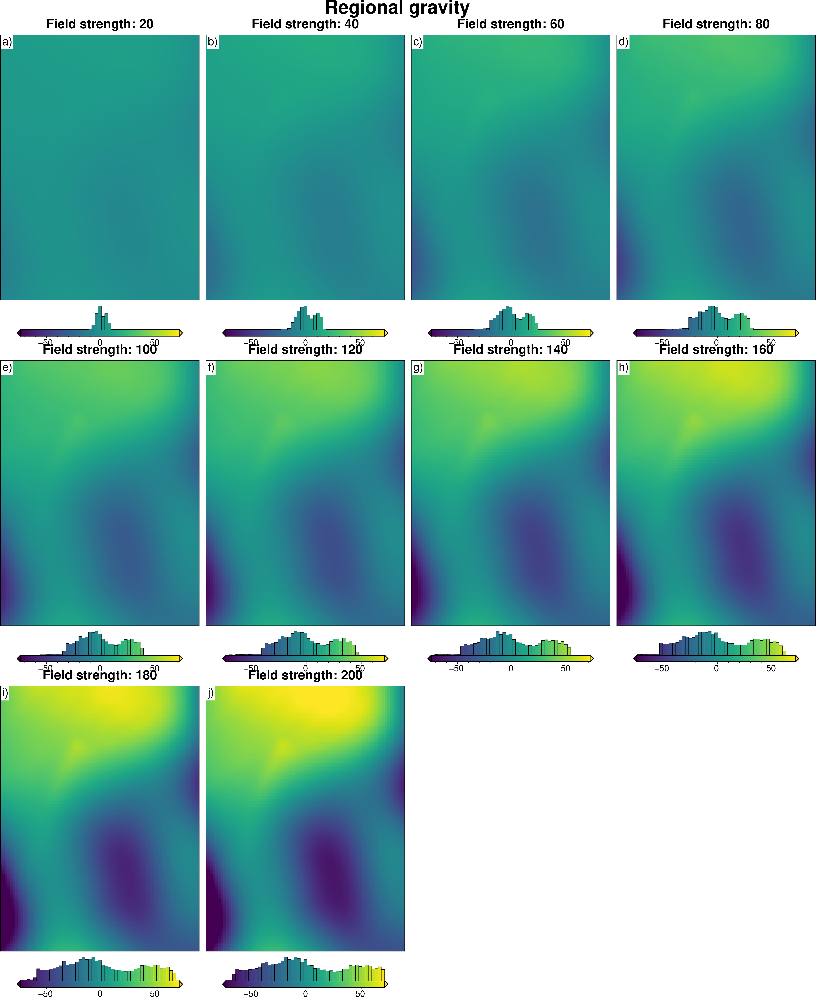

In [18]:
# subplots showing true regional gravity
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = (
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_scaled
        )

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Regional gravity",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
)

fig.show()

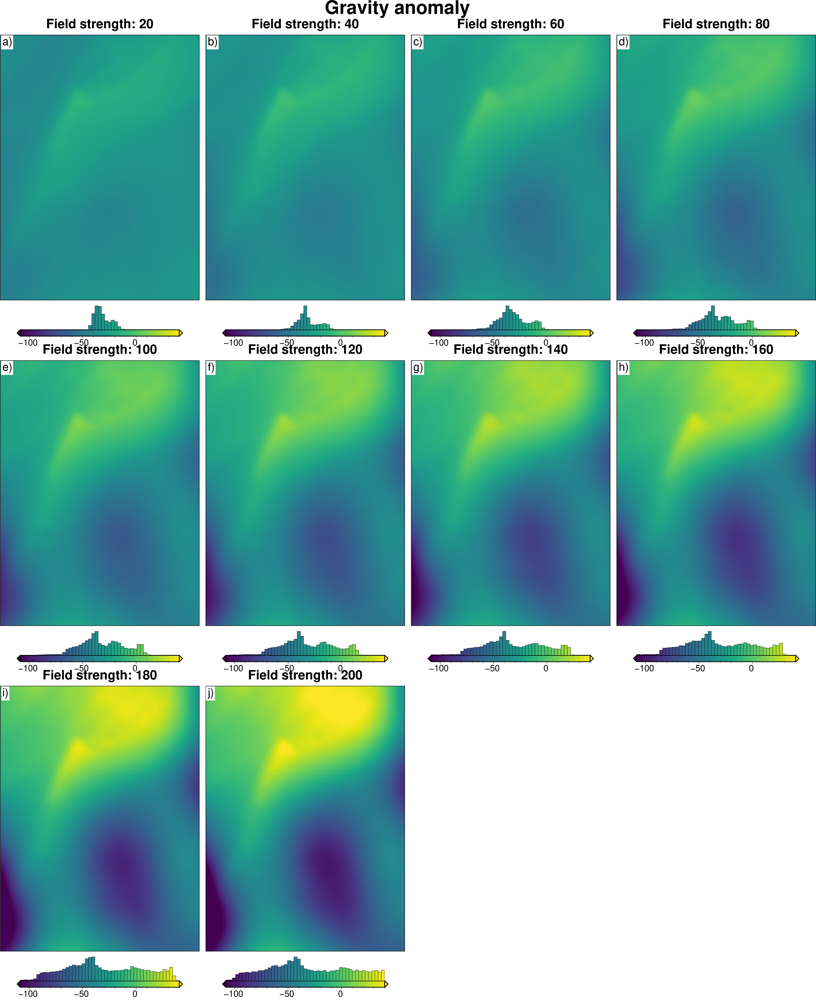

In [19]:
# subplots showing gravity anomaly
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Gravity anomaly",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
)

fig.show()

# Calculate starting gravity and regional

In [14]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    # _ = polar_utils.grd_compare(
    #     grav_grid.true_res,
    #     grav_grid.res,
    #     plot=True,
    #     grid1_name="True residual misfit",
    #     grid2_name="Residual misfit",
    #     cmap="balance+h0",
    #     hist=True,
    #     cbar_yoffset=1,
    #     inset=False,
    #     verbose="q",
    #     title="difference",
    #     grounding_line=False,
    #     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    #     points_style="x.3c",
    # )

In [15]:
# estimate regional
# regional_grav_kwargs = dict(
#     method="constraints",
#     grid_method="eq_sources",
#     cv=True,
#     cv_kwargs=dict(
#         n_trials=50,
#         # damping_limits=(1e-30, 10),
#         depth_limits=(10, 500e3),
#         progressbar=False,
#         fname="../../tmp_outputs/07_regional_sep",
#     ),
#     damping=None,
#     block_size=None,
# )
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="pygmt",
    tension_factor=0,
)

In [21]:
logging.getLogger().setLevel(logging.WARNING)

# sampled_params_df["reg_eqs_damping"] = pd.Series()
# sampled_params_df["reg_eqs_depth"] = pd.Series()
# sampled_params_df["reg_eqs_score"] = pd.Series()


for _i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate the starting gravity
    grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
        coordinates=(
            grav_df.easting,
            grav_df.northing,
            grav_df.upward,
        ),
        field="g_z",
        progressbar=False,
    )

    # calculate the true residual misfit
    grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

    # temporarily set some kwargs
    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points
    # temp_reg_kwargs["cv_kwargs"]["fname"] = f"../../tmp_outputs/07_regional_sep_{i}"
    # temp_reg_kwargs["cv_kwargs"]["plot"] = False
    # temp_reg_kwargs["cv_kwargs"]["progressbar"] = False

    grav_df = regional.regional_separation(
        grav_df=grav_df,
        **temp_reg_kwargs,
    )
    # regional_comparison(grav_df)

    # # re-load the study from the saved pickle file
    # with pathlib.Path(f"../../tmp_outputs/07_regional_sep_{i}.pickle").open("rb") as f:
    #     reg_study = pickle.load(f)
    # # reg_eq_damping = min(reg_study.best_trials, key=lambda t: t.values[0]).params[
    # #     "damping"
    # # ]
    # reg_eq_depth = min(reg_study.best_trials, key=lambda t: t.values[0]).params["depth"]
    # reg_score = reg_study.best_trial.value

    # # add to dataframe
    # # sampled_params_df.loc[i, "reg_eqs_damping"] = reg_eq_damping
    # sampled_params_df.loc[i, "reg_eqs_depth"] = reg_eq_depth
    # sampled_params_df.loc[i, "reg_eqs_score"] = reg_score

    # resave gravity dataframe
    grav_df.to_csv(row.grav_df_fname, index=False)

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.091585
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.183171
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.274756
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.366342
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.457927


In [22]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [23]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.091585
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.183171
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.274756
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.366342
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.457927


In [24]:
# subplots showing grav data loss from sampling and noise
grids = []
cbar_labels = []
row_titles = []
column_titles = []
points = []
# iterate over the ensemble starting with high noise, low line numbers
# row per regional strength and column per constraint numbers
for i, row in sampled_params_df.sort_values(
    by=["regional_strengths", "constraint_numbers"],
    ascending=False,
).iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    grav_df = pd.read_csv(row.grav_df_fname)
    grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
    dif = grav_grid.basement_grav_scaled - grav_grid.reg
    # add to lists
    grids.append(dif)
    cbar_labels.append(f"RMSE: {round(utils.rmse(dif), 2)} (mGal)")
    if i % num == 0:
        column_titles.append(f"{row.constraint_numbers} constraints")
    if i < num:
        row_titles.append(f"strength: {round(row.regional_strengths, 1)} mGal")
    points.append(constraint_points[constraint_points.inside])
print(row_titles)
print(column_titles)

fig = maps.subplots(
    grids,
    fig_height=8,
    fig_title="Regional gravity error",
    fig_title_font="75p,Helvetica-Bold,black",
    fig_title_y_offset="5c",
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    # hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    row_titles=row_titles,
    column_titles=column_titles,
    row_titles_font="25p,Helvetica,black",
    column_titles_font="25p,Helvetica,black",
    point_sets=points,
    points_style="x.2c",
)
fig.show()

['strength: 200.0 mGal', 'strength: 180.0 mGal', 'strength: 160.0 mGal', 'strength: 140.0 mGal', 'strength: 120.0 mGal', 'strength: 100.0 mGal', 'strength: 80.0 mGal', 'strength: 60.0 mGal', 'strength: 40.0 mGal', 'strength: 20.0 mGal']
['650 constraints', '369 constraints', '210 constraints', '119 constraints', '68 constraints', '38 constraints', '22 constraints', '12 constraints', '7 constraints', '4 constraints']


In [26]:
sampled_params_df["regional_error"] = np.nan
sampled_params_df["gravity_anomaly_rms"] = np.nan

for i, row in sampled_params_df.iterrows():
    grav_df = pd.read_csv(row.grav_df_fname)

    sampled_params_df.loc[i, "regional_error"] = utils.rmse(
        grav_df.basement_grav_scaled - grav_df.reg
    )
    sampled_params_df.loc[i, "gravity_anomaly_rms"] = utils.rmse(
        grav_df.gravity_anomaly
    )
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.091585,1.540204,32.531647
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.183171,3.181112,33.192927
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.274756,4.826274,34.332353
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.366342,6.472408,35.904434
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.457927,8.118953,37.855304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,24.549513,0.077652,40.129758
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.641098,0.081903,42.676091
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,32.732684,0.086943,45.448628
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,36.824269,0.092644,48.408517


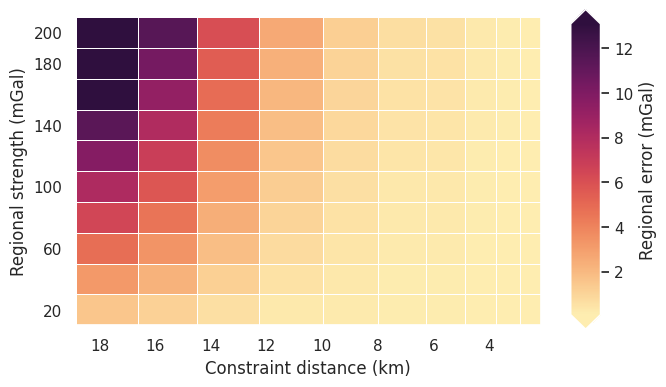

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Constraint distance (km)",
    # x="constraint_numbers",
    # x_title="Number of constraints",
    # x="constraints_per_10000sq_km",
    # x_title="Constraints per $10000 km^2$",
    y="regional_strengths",
    y_title="Regional strength (mGal)",
    background="regional_error",
    background_title="Regional error (mGal)",
    # plot_title="Constraint spacing vs regional strength",
    background_robust=True,
    # logx=True,
    flipx=True,
    constrained_layout=False,
)

# Inversion with true density contrast

In [111]:
for i, row in sampled_params_df.iterrows():
    # set results file name, add results file name
    sampled_params_df.loc[i, "true_density_results_fname"] = (
        f"{ensemble_path}_damping_cv_{i}"
    )
    sampled_params_df.loc[i, "true_density_inverted_bathymetry_fname"] = (
        f"{ensemble_path}_true_density_inverted_bathymetry_{i}.nc"
    )
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,density_cv_results_fname,best_density_contrast,final_inversion_fname,constraints_rmse,inversion_rmse,inversion_mae,topo_improvement_rmse,topo_improvement_mae,true_density_results_fname,true_density_inverted_bathymetry_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1516.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.416089,25.682455,15.097118,20.638987,13.253935,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1675.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.794399,45.386962,26.057861,0.934480,2.293191,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1845.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.235913,64.446391,36.425282,-18.124949,-8.074229,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2149.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.551318,74.584376,42.509801,-28.262934,-14.158749,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2538.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.680021,76.671870,44.698486,-30.350428,-16.347433,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2925.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.781154,3.026861,1.832350,2.901217,1.502991,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3147.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.782746,2.904849,1.775438,3.023229,1.559903,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.386,2.521,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,...,../res

In [ ]:
logging.getLogger().setLevel(logging.WARNING)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200,
        "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
    }

    # run the inversion workflow, including a cross validation for the damping parameter
    _ = inversion.run_inversion_workflow(
        grav_df=grav_df,
        starting_prisms=starting_prisms,
        # for creating test/train splits
        grav_spacing=spacing,
        inversion_region=inversion_region,
        run_damping_cv=True,
        # damping_limits=(0.001, 0.1),
        # damping_cv_trials=8,
        damping_limits=(0.025, 0.025),
        damping_cv_trials=1,
        damping_cv_startup_trials=1,
        damping_cv_progressbar=False,
        # plot_cv=True,
        fname=row.true_density_results_fname,
        **kwargs,
    )

    sampled_params_df.head()

In [129]:
for i, row in sampled_params_df.iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.true_density_results_fname}_results.pickle").open(
        "rb"
    ) as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    # collect the results
    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        f"true_density_inverted_bathymetry_{i}",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(
        constraint_points.true_upward
        - constraint_points[f"true_density_inverted_bathymetry_{i}"]
    )

    # clip to inversion region
    final_bathymetry_inside = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    inversion_rmse = utils.rmse(inside_bathymetry - final_bathymetry_inside)

    # save final topography to file
    final_bathymetry.to_netcdf(row.true_density_inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "true_density_constraints_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "true_density_inversion_rmse"] = inversion_rmse

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,final_inversion_fname,true_density_results_fname,true_density_inverted_bathymetry_fname,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse,true_density_inversion_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.424015,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001,-26.020559,26.666656
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.886965,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201,-98.899759,54.946683
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.435685,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838,-162.780396,83.417783
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.028855,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373,-221.045930,111.988379
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.649128,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769,-270.563327,140.641935


In [134]:
sampled_params_df["true_density_topo_improvement_rmse"] = (
    sampled_params_df.starting_bathymetry_rmse
    - sampled_params_df.true_density_inversion_rmse
)

In [135]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [136]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,true_density_results_fname,true_density_inverted_bathymetry_fname,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse,true_density_inversion_rmse,true_density_topo_improvement_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.424015,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001,-26.020559,26.666656,19.654786
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.886965,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201,-98.899759,54.946683,-8.625241
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.435685,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838,-162.780396,83.417783,-37.096341
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.028855,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373,-221.045930,111.988379,-65.666937
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.649128,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769,-270.563327,140.641935,-94.320493


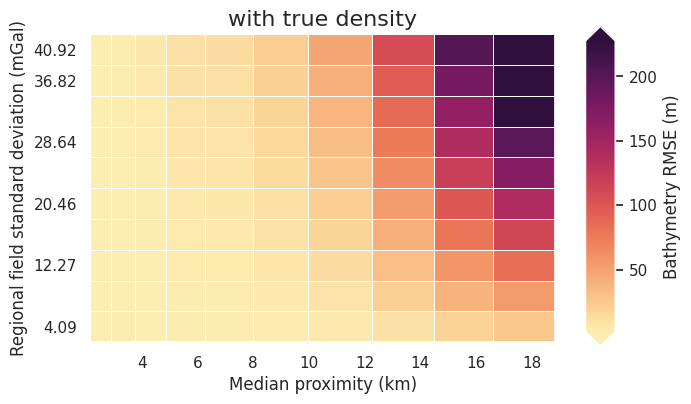

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="true_density_inversion_rmse",
    background_title="Bathymetry RMSE (m)",
    background_robust=True,
    # logx=True,
    # flipx=True,
    constrained_layout=False,
    plot_title="with true density",
)

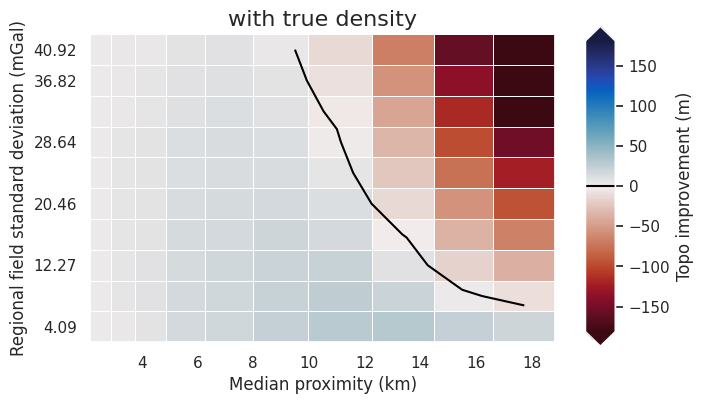

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="true_density_topo_improvement_rmse",
    background_title="Topo improvement (m)",
    background_cmap="cmo.balance_r",
    background_cpt_lims=polar_utils.get_min_max(
        sampled_params_df.true_density_topo_improvement_rmse,
        robust=True,
        absolute=True,
    ),
    plot_contours=[0],
    contour_color="black",
    constrained_layout=False,
    plot_title="with true density",
)

# Density optimization

In [118]:
for i, row in sampled_params_df.iterrows():
    # add results file name
    sampled_params_df.loc[i, "density_estimation_results_fname"] = (
        f"{ensemble_path}_density_cv_{i}"
    )
    sampled_params_df.loc[i, "density_estimation_inverted_bathymetry_fname"] = (
        f"{ensemble_path}_density_estimation_inverted_bathymetry_{i}.nc"
    )

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,regional_error,gravity_anomaly_rms,density_cv_results_fname,best_density_contrast,final_inversion_fname,true_density_results_fname,true_density_inverted_bathymetry_fname,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1.540204,32.531647,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1516.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,26.666656,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,3.181112,33.192927,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1675.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,54.946683,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,4.826274,34.332353,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1845.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,83.417783,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,6.472408,35.904434,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2149.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,111.988379,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,8.118953,37.855304,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2538.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,140.641935,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...


In [ ]:
for i, row in tqdm(
    sampled_params_df.iloc[11:].iterrows(), total=len(sampled_params_df)
):
    # load data
    grav_df = pd.read_csv(row.grav_df_fname)
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200,
        "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
        "solver_damping": 0.025,
    }

    # run an optimization to find the optimal density contrast
    # automatically reruns inversion with optimal density contrast
    # and saves the results to <fname>_results.pickle
    _, _ = optimization.optimize_inversion_zref_density_contrast(
        grav_df=grav_df,
        constraints_df=constraint_points,
        density_contrast_limits=(1400, 3300),
        zref=0,
        n_trials=8,
        starting_topography=starting_bathymetry,
        regional_grav_kwargs=dict(
            method="constant",
            constant=0,
        ),
        fname=row.density_estimation_results_fname,
        plot_cv=False,
        progressbar=False,
        **kwargs,
    )

sampled_params_df.head()

In [ ]:
for i, row in sampled_params_df.iterrows():
    # load data
    grav_df = pd.read_csv(row.grav_df_fname)
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load study
    with pathlib.Path(f"{row.density_estimation_results_fname}_study.pickle").open(
        "rb"
    ) as f:
        study = pickle.load(f)

    # add best density to dataframe
    sampled_params_df.loc[i, "best_density_contrast"] = study.best_params[
        "density_contrast"
    ]

    # load saved inversion results
    with pathlib.Path(f"{row.density_estimation_results_fname}_results.pickle").open(
        "rb"
    ) as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        f"density_estimation_inverted_bathymetry_{i}",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(
        constraint_points.true_upward
        - constraint_points[f"density_estimation_inverted_bathymetry_{i}"]
    )

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    inversion_rmse = utils.rmse(inside_bathymetry - final_bathymetry)

    # save final topography to file
    final_bathymetry.to_netcdf(row.density_estimation_inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "density_estimation_constraints_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "density_estimation_inversion_rmse"] = inversion_rmse

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,density_cv_results_fname,best_density_contrast,final_inversion_fname,true_density_results_fname,true_density_inverted_bathymetry_fname,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1516.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,26.666656,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1675.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,54.946683,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1845.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,83.417783,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2149.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,111.988379,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2538.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,140.641935,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769


In [120]:
sampled_params_df["density_estimation_topo_improvement_rmse"] = (
    sampled_params_df.starting_bathymetry_rmse
    - sampled_params_df.density_estimation_inversion_rmse
)

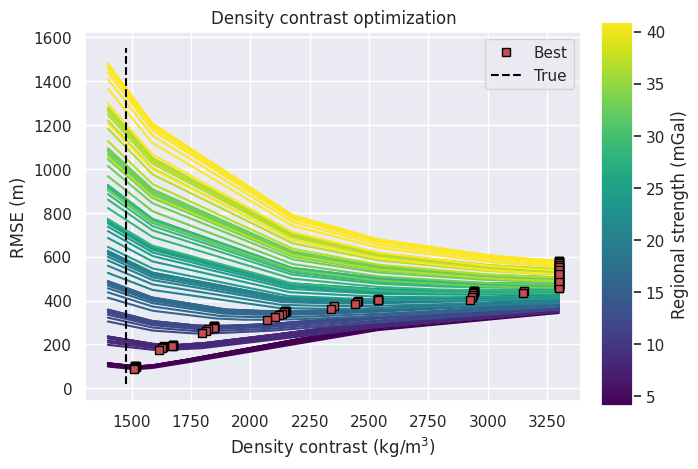

In [ ]:
norm = plt.Normalize(
    vmin=sampled_params_df.regional_stdev.values.min(),
    vmax=sampled_params_df.regional_stdev.values.max(),
)

fig, ax = plt.subplots()

for i, row in sampled_params_df.iterrows():
    # load study
    with pathlib.Path(f"{row.density_estimation_results_fname}_study.pickle").open(
        "rb"
    ) as f:
        study = pickle.load(f)

    label = "Best" if i == 0 else None

    study_df = study.trials_dataframe()[["value", "params_density_contrast"]]
    df = study_df.sort_values(by="params_density_contrast")
    best_score = df.value.argmin()

    ax.plot(
        df.params_density_contrast.iloc[best_score],
        df.value.iloc[best_score],
        "s",
        markersize=6,
        color="r",
        label=label,
        zorder=10,
        markeredgecolor="black",
        linewidth=0.5,
    )
    ax.plot(
        df.params_density_contrast,
        df.value,
        # marker="o",
        color=plt.cm.viridis(norm(row.regional_stdev)),  # pylint: disable=no-member
    )
    # ax.scatter(
    #     df.params_density_contrast,
    #     df.value,
    #     s=50,
    #     marker=".",
    #     color="black",
    #     edgecolors="black",
    #     zorder=10,
    # )

ax.vlines(
    true_density_contrast,
    ax.get_ylim()[0],
    ax.get_ylim()[1],
    color="black",
    linestyle="--",
    label="True",
)
ax.legend(loc="best")
ax.set_title("Density contrast optimization")
ax.set_xlabel("Density contrast (kg/m$^3$)")
ax.set_ylabel("RMSE (m)")

sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
cax = fig.add_axes([0.93, 0.1, 0.05, 0.8])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("Regional strength (mGal)")

In [122]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [123]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,best_density_contrast,final_inversion_fname,true_density_results_fname,true_density_inverted_bathymetry_fname,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1516.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,26.666656,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001,-26.020559
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1675.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,54.946683,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201,-98.899759
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1845.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,83.417783,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838,-162.780396
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,2149.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,111.988379,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373,-221.045930
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,2538.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,140.641935,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769,-270.563327


In [124]:
sampled_params_df.describe()

,constraint_numbers,regional_strengths,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_mae,starting_bathymetry_rmse,regional_stdev,regional_error,gravity_anomaly_rms,best_density_contrast,true_density_constraints_rmse,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,149.900000,110.000000,8.220300,8.926700,330.933333,0.083960,15.135698,26.063273,22.503720,2.175436,40.200314,2571.620000,38.599665,378.239222,301.971157,-275.907884
std,200.751844,57.735027,4.614355,5.089871,66.431876,0.095932,8.923906,14.282003,11.811390,3.532693,6.321093,705.793211,61.254465,145.110822,120.556429,121.334630
min,4.000000,20.000000,2.386000,2.521000,282.666667,0.003561,3.335341,5.928078,4.091585,0.070938,32.531647,1508.000000,2.052972,87.826120,72.116315,-443.088677
25%,12.000000,60.000000,4.019000,4.253000,285.333333,0.006497,6.381548,11.358149,12.274756,0.153843,34.332353,1845.000000,3.476150,281.311494,209.102186,-375.882388
50%,53.000000,110.000000,7.386500,7.974000,299.000000,0.045115,13.749814,24.798911,22.503720,0.488406,38.992531,2731.500000,9.146388,405.247969,335.209546,-306.034425
75%,210.000000,160.000000,12.343000,13.509000,350.000000,0.131169,24.695174,41.525870,32.732684,2.360761,45.448628,3300.000000,42.535287,493.916339,402.580836,-185.831308
max,650.000000,200.000000,16.224000,17.741000,496.666667,0.283029,28.351052,46.321442,40.915854,16.353607,51.523481,3300.000000,285.028396,580.478543,449.027895,-26.020559


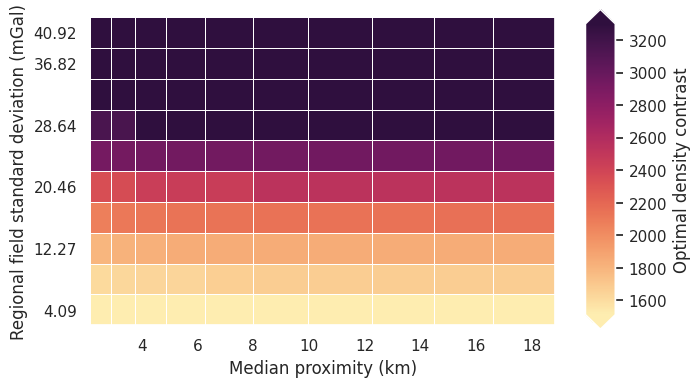

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="best_density_contrast",
    background_title="Optimal density contrast",
    background_robust=True,
    # logx=True,
    # flipx=True,
    constrained_layout=False,
)

# Redo with optimal density


In [142]:
for i, row in sampled_params_df.iterrows():
    # add results file name
    sampled_params_df.loc[i, "final_inversion_results_fname"] = (
        f"{ensemble_path}_final_inversion_{i}"
    )
    sampled_params_df.loc[i, "final_inverted_bathymetry_fname"] = (
        f"{ensemble_path}_final_inverted_bathymetry_{i}.nc"
    )

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,true_density_constraints_rmse,density_estimation_results_fname,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inverted_bathymetry_fname,final_inversion_results_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1.424015,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001,-26.020559,26.666656,19.654786,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,1.886965,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201,-98.899759,54.946683,-8.625241,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,2.435685,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838,-162.780396,83.417783,-37.096341,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,3.028855,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373,-221.045930,111.988379,-65.666937,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,3.649128,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769,-270.563327,140.641935,-94.320493,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...


In [ ]:
logging.getLogger().setLevel(logging.WARNING)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    grav_df = pd.read_csv(row.grav_df_fname)
    starting_bathymetry = xr.open_dataarray(row.starting_bathymetry_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200,
        "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
        "solver_damping": 0.025,
    }

    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points

    # run the inversion workflow using the optimal damping and density values
    _ = inversion.run_inversion_workflow(
        grav_df=grav_df,
        density_contrast=row.best_density_contrast,
        zref=0,
        starting_topography=starting_bathymetry,
        regional_grav_kwargs=temp_reg_kwargs,
        fname=row.final_inversion_fname,
        create_starting_prisms=True,
        calculate_starting_gravity=True,
        calculate_regional_misfit=True,
        **kwargs,
    )

    sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

In [150]:
for i, row in sampled_params_df.iterrows():
    # load data
    grav_df = pd.read_csv(row.grav_df_fname)
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.final_inversion_results_fname}_results.pickle").open(
        "rb"
    ) as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        f"final_inverted_bathymetry_{i}",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(
        constraint_points.true_upward
        - constraint_points[f"final_inverted_bathymetry_{i}"]
    )

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    inversion_rmse = utils.rmse(inside_bathymetry - final_bathymetry)

    # save final topography to file
    final_bathymetry.to_netcdf(row.final_inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "final_inversion_constraints_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "final_inversion_rmse"] = inversion_rmse

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,...,density_estimation_inverted_bathymetry_fname,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inverted_bathymetry_fname,final_inversion_results_fname,final_inversion_constraints_rmse,final_inversion_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,100.609018,72.342001,-26.020559,26.666656,19.654786,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.416304,25.705860
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,196.921569,145.221201,-98.899759,54.946683,-8.625241,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.817794,47.161472
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,284.904690,209.101838,-162.780396,83.417783,-37.096341,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.235913,64.446391
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,352.123951,267.367373,-221.045930,111.988379,-65.666937,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.521366,73.064049
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.224,17.741,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,405.240948,316.884769,-270.563327,140.641935,-94.320493,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.673602,76.397586


In [151]:
sampled_params_df["final_inversion_topo_improvement_rmse"] = (
    sampled_params_df.starting_bathymetry_rmse - sampled_params_df.final_inversion_rmse
)

In [10]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [6]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_fname,starting_prisms_fname,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,...,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inverted_bathymetry_fname,final_inversion_results_fname,final_inversion_constraints_rmse,final_inversion_rmse,final_inversion_topo_improvement_rmse,maximum_constraint_proximity,constraint_proximity_skewness,median_proximity
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,26.666656,19.654786,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.416304,25.705860,20.615582,51.305,0.483691,17.755
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,54.946683,-8.625241,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.817794,47.161472,-0.840030,51.305,0.483691,17.755
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,83.417783,-37.096341,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.235913,64.446391,-18.124949,51.305,0.483691,17.755
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,111.988379,-65.666937,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.521366,73.064049,-26.742607,51.305,0.483691,17.755
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,282.666667,0.003561,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.351052,46.321442,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,140.641935,-94.320493,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.673602,76.397586,-30.076144,51.305,0.483691,17.755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.052972,3.875105,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.797255,3.143586,2.784492,6.333,-0.144477,2.520
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.055300,3.872778,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.820418,3.222559,2.705518,6.333,-0.144477,2.520
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,496.666667,0.283029,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.335341,5.928078,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,...,2.088355,3.839723,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.834046,3.239747,2.688331,6.333,-0.1

In [8]:
sampled_params_df.columns

Index(['constraint_numbers', 'regional_strengths', 'constraint_points_fname',
       'constraint_spacing_full', 'constraint_spacing',
       'constraints_per_10000sq_km', 'constraints_starting_rmse',
       'starting_bathymetry_fname', 'starting_prisms_fname',
       'starting_bathymetry_mae', 'starting_bathymetry_rmse', 'grav_df_fname',
       'regional_stdev', 'regional_error', 'gravity_anomaly_rms',
       'density_cv_results_fname', 'best_density_contrast',
       'true_density_results_fname', 'true_density_inverted_bathymetry_fname',
       'true_density_constraints_rmse', 'density_estimation_results_fname',
       'density_estimation_inverted_bathymetry_fname',
       'density_estimation_constraints_rmse',
       'density_estimation_inversion_rmse',
       'density_estimation_topo_improvement_rmse',
       'true_density_inversion_rmse', 'true_density_topo_improvement_rmse',
       'final_inverted_bathymetry_fname', 'final_inversion_results_fname',
       'final_inversion_constrai

In [154]:
sampled_params_df.describe()

,constraint_numbers,regional_strengths,constraint_spacing_full,constraint_spacing,constraints_per_10000sq_km,constraints_starting_rmse,starting_bathymetry_mae,starting_bathymetry_rmse,regional_stdev,regional_error,...,best_density_contrast,true_density_constraints_rmse,density_estimation_constraints_rmse,density_estimation_inversion_rmse,density_estimation_topo_improvement_rmse,true_density_inversion_rmse,true_density_topo_improvement_rmse,final_inversion_constraints_rmse,final_inversion_rmse,final_inversion_topo_improvement_rmse
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,149.900000,110.000000,8.220300,8.926700,330.933333,0.083960,15.135698,26.063273,22.503720,2.175436,...,2571.620000,1.693412,378.239222,301.971157,-275.907884,38.599665,-12.536393,1.353637,20.954113,5.109160
std,200.751844,57.735027,4.614355,5.089871,66.431876,0.095932,8.923906,14.282003,11.811390,3.532693,...,705.793211,1.382769,145.110822,120.556429,121.334630,61.254465,52.420555,0.677834,26.769199,18.506826
min,4.000000,20.000000,2.386000,2.521000,282.666667,0.003561,3.335341,5.928078,4.091585,0.070938,...,1508.000000,0.281780,87.826120,72.116315,-443.088677,2.052972,-238.706954,0.317716,2.422678,-74.883909
25%,12.000000,60.000000,4.019000,4.253000,285.333333,0.006497,6.381548,11.358149,12.274756,0.153843,...,1845.000000,0.797987,281.311494,209.102186,-375.882388,3.476150,-4.074898,0.942926,4.083646,3.423450
50%,53.000000,110.000000,7.386500,7.974000,299.000000,0.045115,13.749814,24.798911,22.503720,0.488406,...,2731.500000,1.265563,405.247969,335.209546,-306.034425,9.146388,5.988084,1.113402,8.180896,9.107970
75%,210.000000,160.000000,12.343000,13.509000,350.000000,0.131169,24.695174,41.525870,32.732684,2.360761,...,3300.000000,2.025806,493.916339,402.580836,-185.831308,42.535287,12.998504,1.570118,25.834346,15.326811
max,650.000000,200.000000,16.224000,17.741000,496.666667,0.283029,28.351052,46.321442,40.915854,16.353607,...,3300.000000,6.978508,580.478543,449.027895,-26.020559,285.028396,31.052620,3.725163,121.205351,31.573318


# Examine results

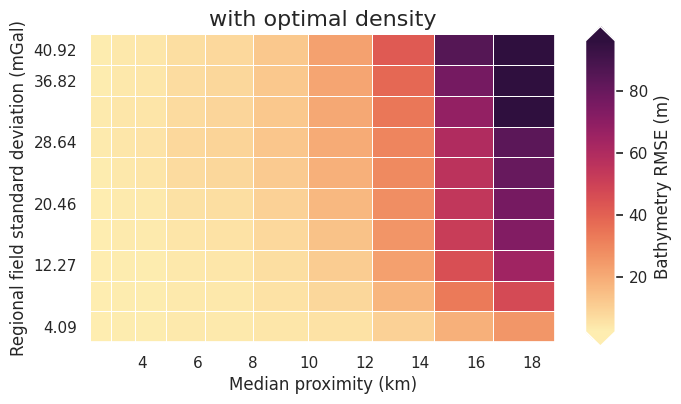

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="final_inversion_rmse",
    background_title="Bathymetry RMSE (m)",
    background_robust=True,
    # logx=True,
    # flipx=True,
    constrained_layout=False,
    plot_title="with optimal density",
)

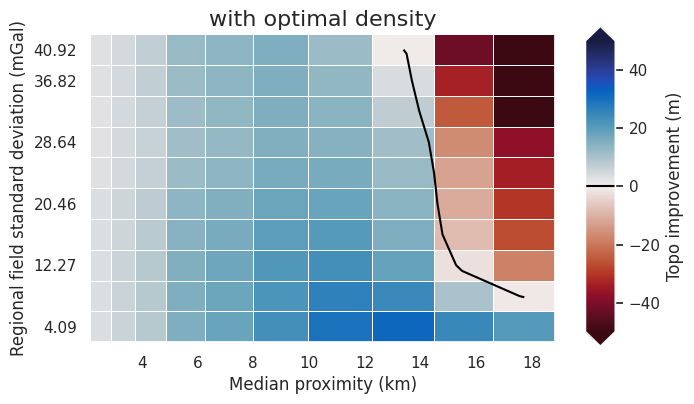

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="final_inversion_topo_improvement_rmse",
    background_title="Topo improvement (m)",
    background_cmap="cmo.balance_r",
    background_cpt_lims=polar_utils.get_min_max(
        sampled_params_df.final_inversion_topo_improvement_rmse,
        robust=True,
        absolute=True,
    ),
    plot_contours=[0],
    contour_color="black",
    constrained_layout=False,
    plot_title="with optimal density",
)

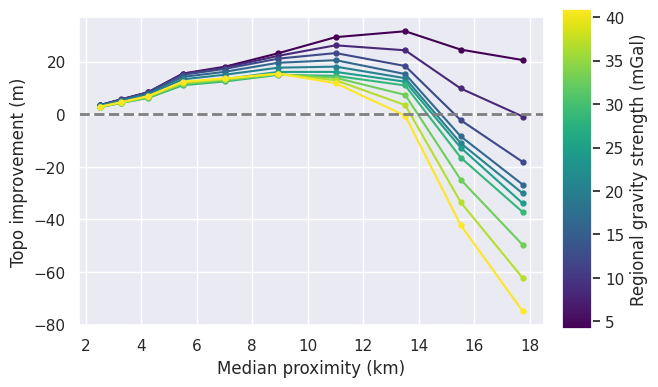

In [ ]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_label="Median proximity (km)",
    # x="constraints_per_10000sq_km",
    # x_label="Constraints per $10000 km^2$",
    y="final_inversion_topo_improvement_rmse",
    y_label="Topo improvement (m)",
    groupby_col="regional_stdev",
    cbar_label="Regional gravity strength (mGal)",
    horizontal_line=0,
)

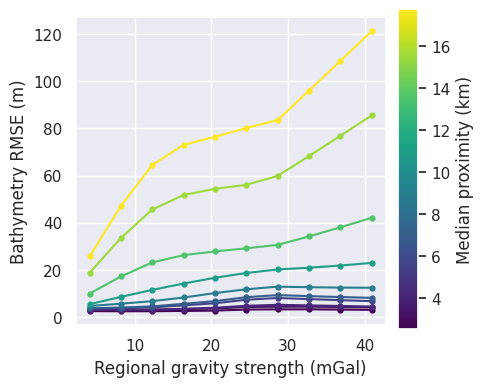

In [ ]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="final_inversion_rmse",
    y_label="Bathymetry RMSE (m)",
    groupby_col="median_proximity",
    cbar_label="Median proximity (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    # slope_min_max=True,
    # slope_mean=True,
)

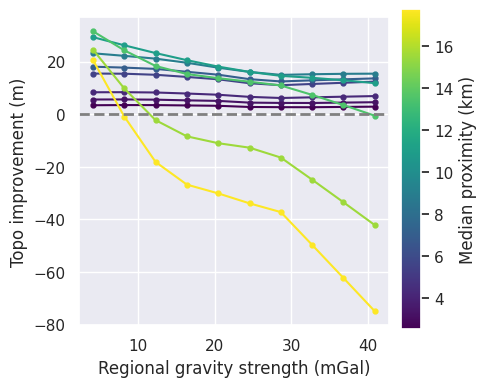

In [ ]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="final_inversion_topo_improvement_rmse",
    y_label="Topo improvement (m)",
    groupby_col="median_proximity",
    cbar_label="Median proximity (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    horizontal_line=0,
    # slope_min_max=True,
    # slope_mean=True,
)

In [168]:
# difference with true and optimal bathymetry
sampled_params_df["inversion_rmse_dif_true_vs_optimal_density"] = (
    sampled_params_df.final_inversion_rmse
    - sampled_params_df.true_density_inversion_rmse
)
sampled_params_df.inversion_rmse_dif_true_vs_optimal_density.describe()

count    100.000000
mean     -17.645552
std       35.502540
min     -163.823045
25%      -14.378648
50%       -0.847072
75%        0.311859
max        1.486134
Name: inversion_rmse_dif_true_vs_optimal_density, dtype: float64

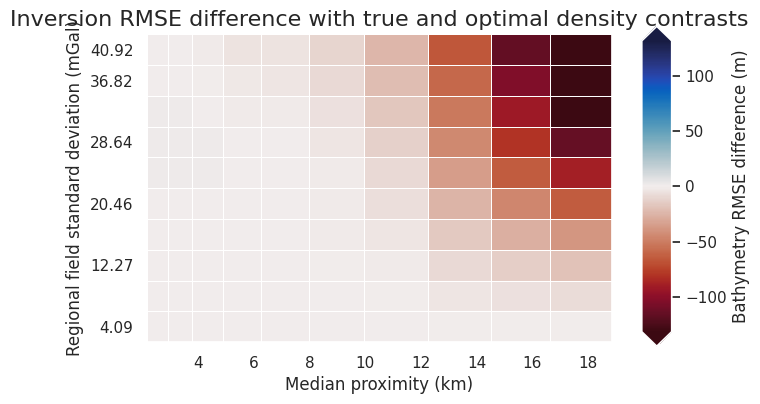

In [ ]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="inversion_rmse_dif_true_vs_optimal_density",
    background_title="Bathymetry RMSE difference (m)",
    background_robust=True,
    background_cmap="cmo.balance_r",
    background_cpt_lims=polar_utils.get_min_max(
        sampled_params_df.inversion_rmse_dif_true_vs_optimal_density,
        robust=True,
        absolute=True,
    ),
    # logx=True,
    # flipx=True,
    constrained_layout=False,
    plot_title="Inversion RMSE difference with true and optimal density contrasts",
)

  0%|          | 0/100 [00:00<?, ?it/s]

/tmp/ipykernel_266082/2947499912.py:83: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



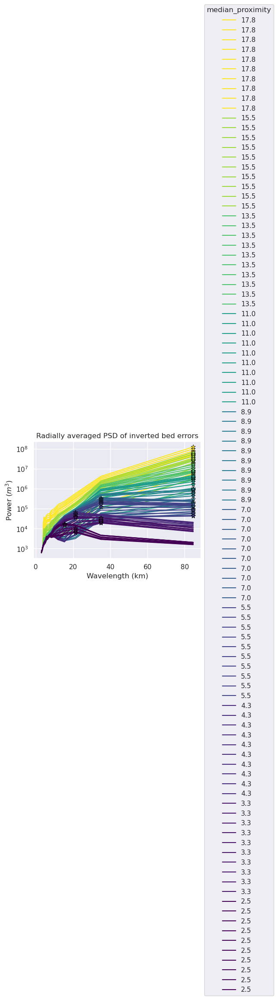

In [ ]:
metric = "median_proximity"
grids = []
names = []
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load saved inversion results
    with pathlib.Path(f"{row.final_inversion_results_fname}_results.pickle").open(
        "rb"
    ) as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    grd = inside_bathymetry - final_bathymetry

    grids.append(grd)
    names.append(round(row[metric], 1))

# grids.append(inside_bathymetry)
# names.append(0)


raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            # detrend='constant',
            detrend="linear",
            # window=False,
            # nfactor=4,
            # spacing_tol=0.01,
            # nfactor=3,
            truncate=False,
        )
    )

fig, ax = plt.subplots(figsize=(5, 3.5))

norm = plt.Normalize(
    vmin=sampled_params_df[metric].min(),
    vmax=sampled_params_df[metric].max(),
)

max_powers = []
max_power_wavelengths = []
for i, da in enumerate(raps_das):
    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=plt.cm.viridis(norm([names[i]])),
    )
    max_ind = da.idxmax()
    max_power = da.max().values
    max_power_wavelength = 1 / (da[da == max_power].freq_r.values[0]) / 1e3
    max_power_wavelengths.append(max_power_wavelength)
    max_powers.append(max_power)
    ax.scatter(
        x=max_power_wavelength,
        y=max_power,
        marker="*",
        edgecolor="black",
        linewidth=0.5,
        color=plt.cm.viridis(norm(names[i])),  # pylint: disable=no-member
        s=60,
        zorder=20,
    )
    # print(f"Max y value at x value: {max_power_wavelength}")

# ax.set_xscale("log")
ax.set_yscale("log")

ax.legend(title=metric, loc="center left", bbox_to_anchor=(1, 0.5))

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("Radially averaged PSD of inverted bed errors")
plt.tight_layout()

# ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

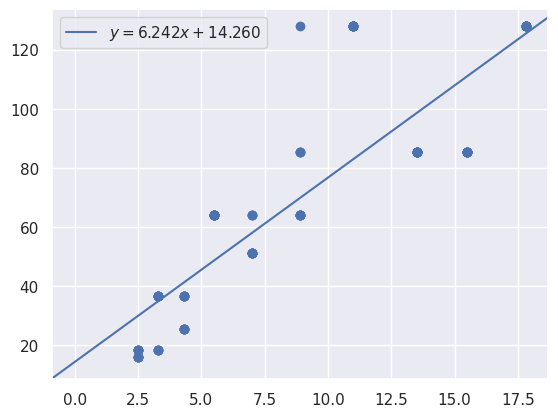

In [21]:
y = max_power_wavelengths
x = names

m, b = np.polyfit(
    x,
    y,
    1,
)

plt.scatter(
    x,
    y,
)

# plot y = m*x + b
plt.axline(xy1=(0, b), slope=m, label=f"$y = {m:.3f}x {b:+.3f}$")
plt.legend()